In [6]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import pandas as pd
import os
import seaborn as sns
import random 
import scipy as sc
import scipy.stats as stats
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import stormeunice as eun
import warnings
import glob
import tqdm

sns.set_theme(style="white")
sns.set_style("white")

random.seed(10)

In [7]:
#Define domain--all of UK

lon_min = -15
lon_max = 20
lat_min = 30
lat_max = 65



Import EPS data to show EPS prediction 

In [8]:

class Data():
    def get_eps_data(experiments, inidate='2022-02-16'):
        """
        Function to load comlete data of simulations on surface level since
        xr has a bug that prevents using
        this as a simpler solution

        Input:
        ------
        experiments: list of strings, list of experiments to import,
                e.g. ['pi', 'curr', 'incr']

        Output:
        -------
        eps: list of xarrays, data and metadata of operational forecasts,
        each list entry is one experiment
        """

        directory = {'pi': '/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/EXP/pi/EU025/sfc/',
                    'curr': '/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/',
                    'incr': '/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/EXP/incr/EU025/sfc/'}

        eps = {}
        for experiment in experiments:
            exp_eps = []
            for c, cont in enumerate(['cf', 'pf']):
                for files in glob.glob(directory[experiment]
                                        + cont + '/*'
                                        + inidate + '*.nc'):
                    print(files)
                    data = xr.open_dataset(files)
                    exp_eps.append(Data.preproc_ds(data.get(['fg10', 'msl',
                                                                'u10', 'v10',
                                                                'u100', 'v100'])))

            eps[experiment] = xr.concat(exp_eps, dim='number').squeeze()

        return eps
    

    def preproc_ds(ds):
        """
        Main pre-processing function
        Writtten by Nick Leach.

        Input:
        ------

        Output:
        -------
        """

        # accumulated variables & scaling factors
        accumulated_vars = {'tp': 60 * 60 * 24 * 1e3,
                            'ttr': 1,
                            'tsr': 1,
                            'str': 1,
                            'ssr': 1,
                            'e': 1}
        accumulated_var_newunits = {'tp': 'mm day$^{-1}$',
                                    'ttr': 'W m$^{-2}$',
                                    'tsr': 'W m$^{-2}$',
                                    'str': 'W m$^{-2}$',
                                    'ssr': 'W m$^{-2}$',
                                    'e': 'm s$^{-1}$'}
        ds = ds.copy().squeeze()
        # set up aux data
        inidate = pd.to_datetime(ds.time[0].values)
        # expand dimensions to include extra info
        if not 'hDate' in ds:
            ds = ds.expand_dims({'inidate': [inidate]}).copy()

        if not 'number' in ds:
            ds = ds.expand_dims({'number': [0]}).copy()

        # put time dimension at front
        ds = ds.transpose('time', ...)
        ds = ds.copy(deep=True)

        # convert accumulated variables into instantaneous
        for var, sf in accumulated_vars.items():
            if var in ds.keys():
                ds[var].loc[dict(time=ds.time[1:])] = Data.accum2rate(ds[var]) * sf
                # set first value to equal zero,
                # should be zero but isn't always
                ds[var].loc[dict(time=ds.time[0])] = 0
                ds[var].attrs['units'] = accumulated_var_newunits[var]
        return ds
        

In [5]:
inidate = ['2022-02-10','2022-02-14','2022-02-16']
eps_msl = {}
for id in inidate:
    eps_msl[id] = Data.get_eps_data(['curr'],inidate=id)['curr'].msl/100




/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/cf/1_2022-02-10.nc
/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/pf/1_2022-02-10.nc
/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/cf/1_2022-02-14.nc
/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/pf/1_2022-02-14.nc
/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/cf/1_2022-02-16.nc
/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/pf/1_2022-02-16.nc


In [3]:
xr.open_dataset('/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MED-R/ENS/EU025/sfc/cf/1_2022-02-10.nc')

<xarray.Dataset>
Dimensions:    (longitude: 289, latitude: 163, time: 125)
Coordinates:
  * longitude  (longitude) float32 -27.0 -26.75 -26.5 -26.25 ... 44.5 44.75 45.0
  * latitude   (latitude) float32 73.5 73.25 73.0 72.75 ... 33.5 33.25 33.0
  * time       (time) datetime64[ns] 2022-02-10 ... 2022-02-20
Data variables: (12/14)
    sst        (time, latitude, longitude) float32 ...
    fg10       (time, latitude, longitude) float32 ...
    tcw        (time, latitude, longitude) float32 ...
    tcwv       (time, latitude, longitude) float32 ...
    msl        (time, latitude, longitude) float32 ...
    tcc        (time, latitude, longitude) float32 ...
    ...         ...
    u10        (time, latitude, longitude) float32 ...
    v10        (time, latitude, longitude) float32 ...
    u100       (time, latitude, longitude) float32 ...
    v100       (time, latitude, longitude) float32 ...
    mxcape6    (time, latitude, longitude) float32 ...
    mxcapes6   (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-12-08 13:03:33 GMT by grib_to_netcdf-2.26.0: grib_to_n...

In [4]:
eps_GUST = {}
for id in inidate:
    eps_GUST[id] = Data.get_eps_data(['curr'],inidate=id)['curr'].fg10


NameError: name 'inidate' is not defined

In [10]:

    
p_max = 1040
p_min = 960

Get all era5 data during an interval and have a look at them

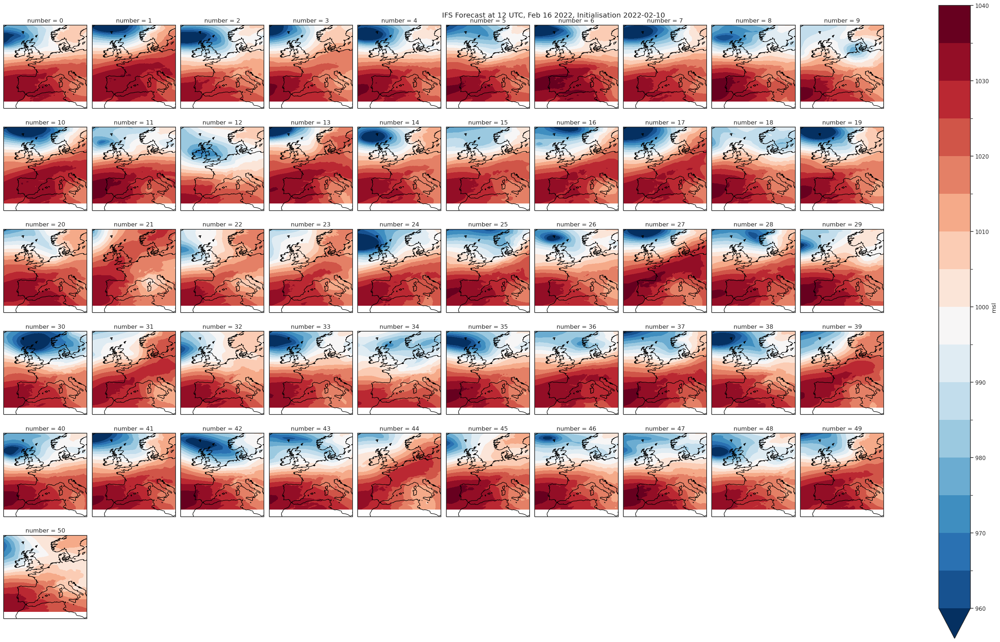

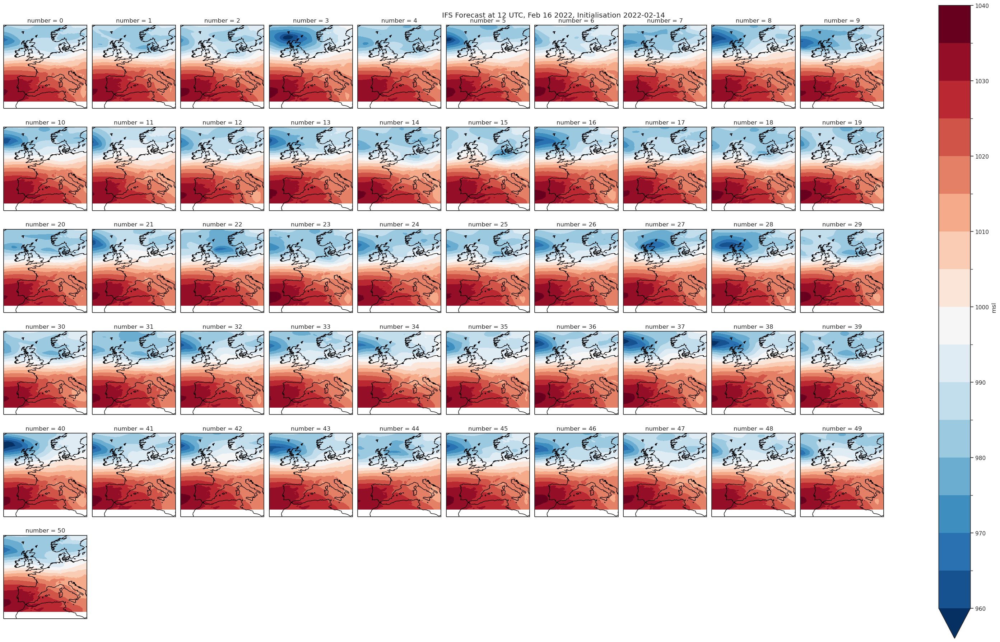

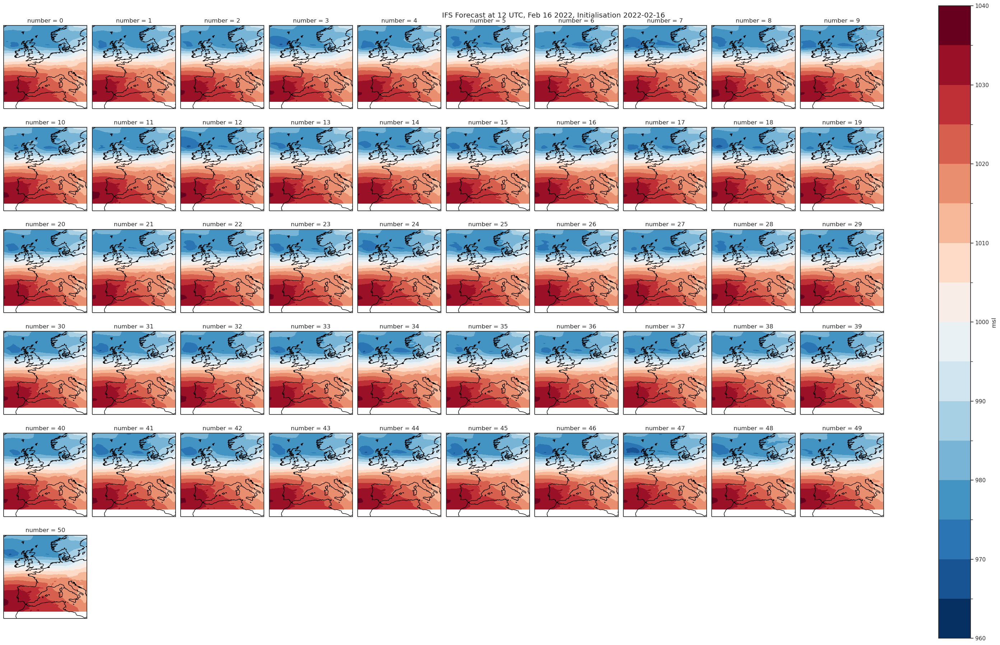

In [11]:
projection = ccrs.PlateCarree()

for id in inidate:

    #eps_msl = eps.sel(inidate=inidate,time='2022-02-18 12').sel(latitude=slice(lat_max,lat_min),longitude=slice(lon_min, lon_max)).msl.squeeze()
    eps_msl_plot = eps_msl[id].sel(time='2022-02-16 12').plot.contourf(col='number',
                          col_wrap=10,
                          vmin=p_min,
                          vmax=p_max,
                          levels=17,
                          cmap='RdBu_r', 
                          subplot_kws = {"projection": projection})

    plt.suptitle('IFS Forecast at 12 UTC, Feb 16 2022, Initialisation '+ id)
    eps_msl_plot.map(lambda: plt.gca().coastlines())

    for i, ax in enumerate(eps_msl_plot.axs.flat):
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=projection)

    plt.savefig('figures/02_stamp_'+id+'_lon'+str(lon_min)+'-'+str(lon_max)+'_lat'+str(lat_min)+'-'+str(lat_max)+'.png')
    plt.savefig('figures/02_stamp_'+id+'_lon'+str(lon_min)+'-'+str(lon_max)+'_lat'+str(lat_min)+'-'+str(lat_max)+'.pdf')
    
    # plt.savefig('figures/05_stamp_'+np.datetime_as_string(inidate.values)[:10]+'_lon'+str(lon_min)+'-'+str(lon_max)+'_lat'+str(lat_min)+'-'+str(lat_max)+'.png')
    # plt.savefig('figures/05_stamp_'+np.datetime_as_string(inidate.values)[:10]+'_lon'+str(lon_min)+'-'+str(lon_max)+'_lat'+str(lat_min)+'-'+str(lat_max)+'.pdf')

In [12]:
era5_2022 = xr.open_dataset('/gf3/predict2/AWH012_LEACH_NASTORM/DATA/ERA5/EU025/sfc/2022.nc')
era5_GUST = era5_2022.fg10.sel(time=slice('2022-02-07','2022-02-22'),latitude=slice(lat_max,lat_min),longitude=slice(lon_min, lon_max)).resample(time='1d').max().load()


era_at_12 = era5_2022.sel(time=era5_2022.time.dt.hour==12).sel(time=slice('2022-02-10','2022-02-21')).sel(latitude=slice(lat_max,lat_min),longitude=slice(lon_min, lon_max))


/home/l/luol/nobackups/miniconda3/envs/storm_dudley/lib/python3.9/site-packages/xarray/core/accessor_dt.py:72: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  values_as_series = pd.Series(values.ravel(), copy=False)


In [13]:
era5_msl_plt = era_at_12.msl/100
era5_msl_plt

<xarray.DataArray 'msl' (time: 12, latitude: 129, longitude: 141)>
array([[[1013.82764, 1014.11017, 1014.3911 , ...,  982.85803,
          982.68787,  982.51776],
        [1014.44244, 1014.5725 , 1014.73615, ...,  983.8677 ,
          983.65735,  983.45514],
        [1014.9336 , 1014.95776, 1014.985  , ...,  984.7938 ,
          984.6253 ,  984.45514],
        ...,
        [1022.9626 , 1023.1231 , 1023.2434 , ..., 1027.189  ,
         1027.1713 , 1027.1906 ],
        [1023.0878 , 1023.2434 , 1023.3189 , ..., 1027.1263 ,
         1027.1055 , 1027.1263 ],
        [1023.3606 , 1023.4874 , 1023.5003 , ..., 1027.059  ,
         1027.0284 , 1027.0461 ]],

       [[1010.9384 , 1010.8068 , 1010.67194, ..., 1002.74896,
         1002.4889 , 1002.2257 ],
        [1010.85333, 1010.6832 , 1010.48096, ..., 1003.15344,
         1002.8886 , 1002.6286 ],
        [1010.489  , 1010.41675, 1010.34454, ..., 1003.48413,
         1003.2466 , 1003.0058 ],
...
        [1026.9594 , 1026.6962 , 1026.4137 , ..., 1022.3895 ,
         1022.48267, 1022.57733],
        [1026.619  , 1026.3414 , 1026.0669 , ..., 1022.5067 ,
         1022.60944, 1022.73627],
        [1026.3302 , 1026.03   , 1025.762  , ..., 1022.6769 ,
         1022.80365, 1022.94006]],

       [[1005.54834, 1005.89825, 1006.2466 , ...,  993.78424,
          993.8789 ,  993.9737 ],
        [1005.7907 , 1006.05396, 1006.3718 , ...,  993.4487 ,
          993.5708 ,  993.69116],
        [1006.18396, 1006.28186, 1006.37665, ...,  992.91907,
          993.0282 ,  993.14056],
        ...,
        [1026.929  , 1026.8662 , 1026.7892 , ..., 1018.2419 ,
         1018.14874, 1018.0669 ],
        [1026.5886 , 1026.502  , 1026.4216 , ..., 1018.49384,
         1018.38635, 1018.26917],
        [1026.2595 , 1026.144  , 1026.0461 , ..., 1018.68805,
         1018.55646, 1018.4393 ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -15.0 -14.75 -14.5 -14.25 ... 19.5 19.75 20.0
  * latitude   (latitude) float32 65.0 64.75 64.5 64.25 ... 33.5 33.25 33.0
  * time       (time) datetime64[ns] 2022-02-10T12:00:00 ... 2022-02-21T12:00:00

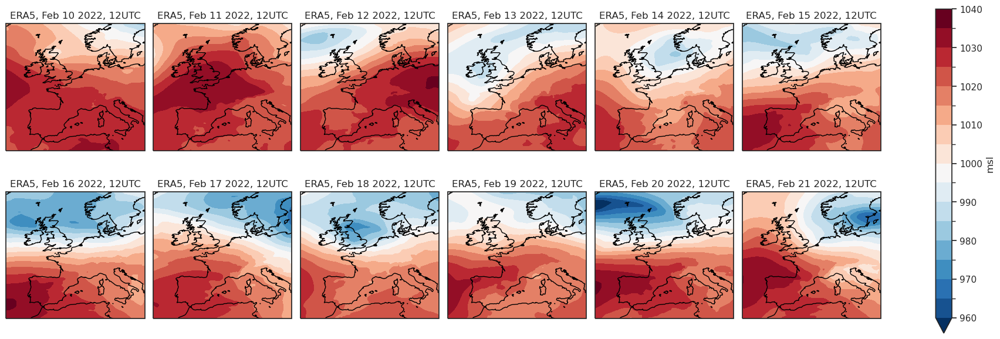

In [14]:
projection = ccrs.PlateCarree()
p_max = 1040
p_min = 960

msl_plot = era5_msl_plt.plot.contourf(vmin = p_min, vmax = p_max,
                                        col = 'time',
                                        col_wrap = 6,
                                        levels = 17,
                                        cmap = 'RdBu_r', 
                                        subplot_kws = {"projection": projection})

for i, ax in enumerate(msl_plot.axs.flat):
     ax.set_title("ERA5, Feb %d 2022, 12UTC" % int(i+10))

msl_plot.map(lambda: plt.gca().coastlines())

So, according to the plot, dudley def hit UK on Feb 16, not exactly 12 but maybe like 18
Actually there is not so much a difference

Comparing ERA and forecasts

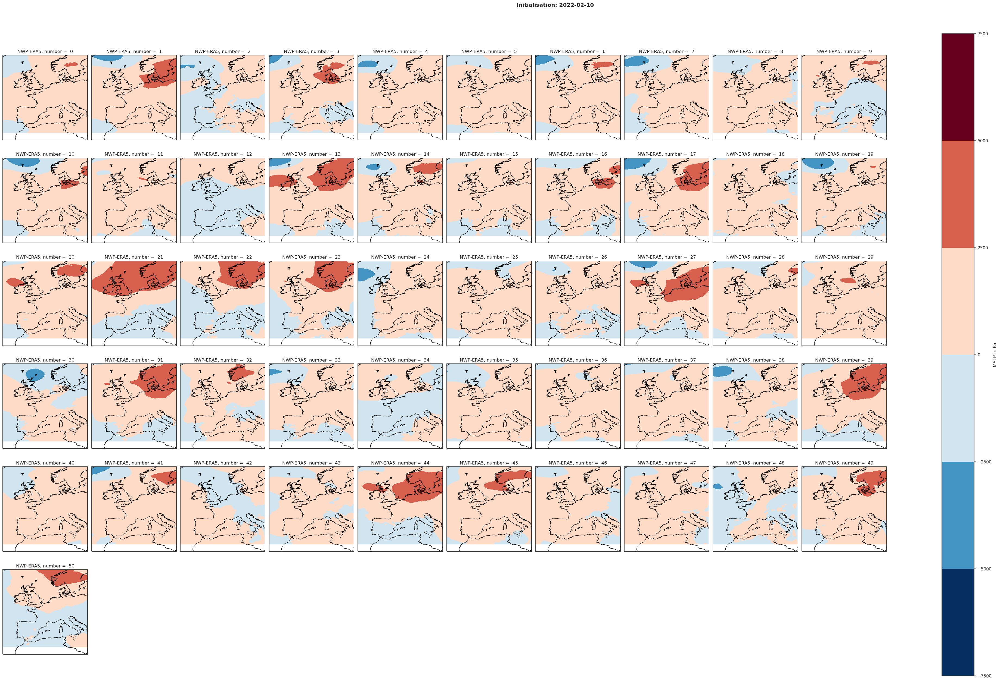

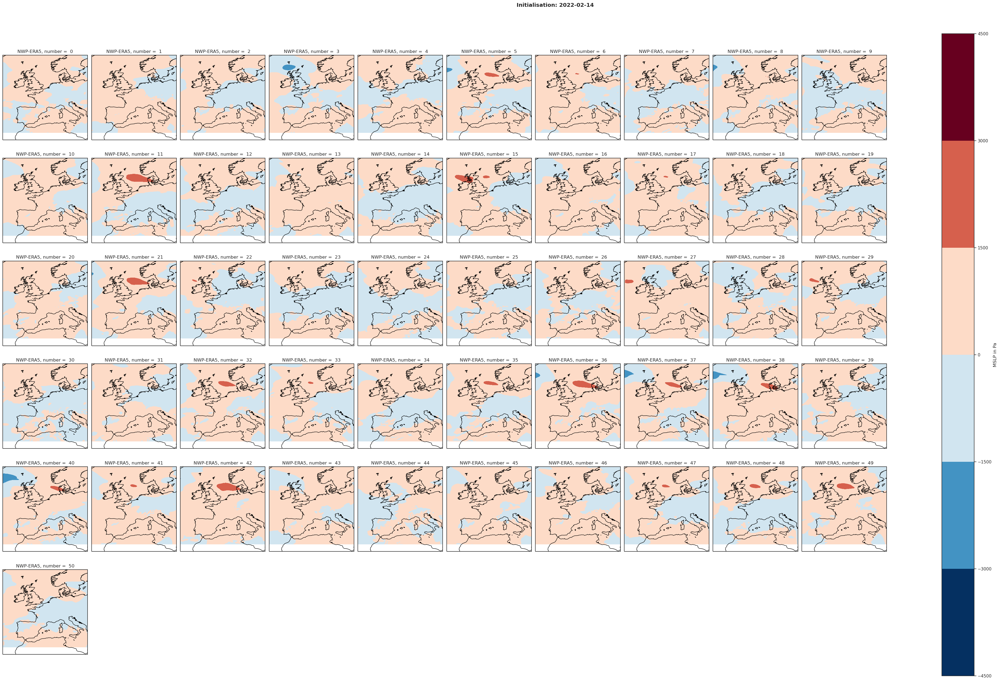

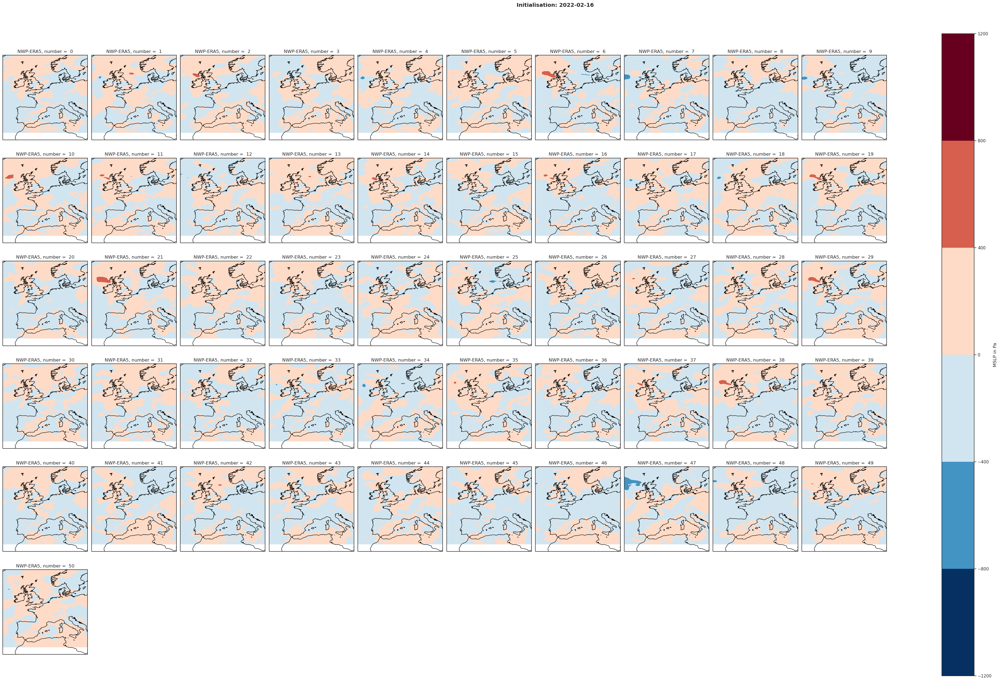

In [15]:
projection = ccrs.PlateCarree()
era_feb16 = era5_2022.sel(time='2022-02-16 12').msl.squeeze()
cbar_kwargs = {'label': 'MSLP in Pa'}

for id in inidate: 
    diff_msl = eps_msl[id].sel(time='2022-02-16 12').squeeze()*100-era_feb16
    diff_plot = diff_msl.plot.contourf(col='number',
                                       col_wrap=10,
                                       cmap='RdBu_r',
                                       cbar_kwargs = cbar_kwargs,
                                       size = 4,
                                       subplot_kws = {"projection": projection})
    
    for i, ax in enumerate(diff_plot.axs.flat):
        ax.set_title("NWP-ERA5, number =  %d" % i)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=projection)
        

    diff_plot.map(lambda: plt.gca().coastlines())
    
    plt.suptitle('Initialisation: '+id, fontweight='bold',y=1.04)


In [138]:
# MIDAS observational data

MIDAS_station_info = pd.read_csv('/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MIDAS/MIDAS_station_info.csv',index_col=0)
MIDAS_station_info['Station_name'] = MIDAS_station_info.Station_name.str.split('\n',expand=True)[0].str.strip()

def get_MIDAS_stations_near(lat,lon,n=1):
    
    dlat = np.deg2rad(MIDAS_station_info.Latitude - lat)
    dlon = np.deg2rad(MIDAS_station_info.Longitude - lon)
    
    a = np.sin(dlat/2.0)**2 + np.cos(lat) * np.cos(MIDAS_station_info.Latitude) * np.sin(dlon/2.0)**2
    
    
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        D = np.arcsin(np.sqrt(a))
    
    return MIDAS_station_info.loc[D.sort_values().index[:n],'src_id'].values

MIDAS_2022 = pd.read_csv('/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MIDAS/wind/midas_wind_202201-202212.txt',
            names=[x.strip() for x in pd.read_csv('https://dap.ceda.ac.uk/badc/ukmo-midas/metadata/table_structures/WMTB.txt',header=None).values.flatten()])

MIDAS_2022 = MIDAS_2022.apply(lambda x: x.replace(' ',np.nan).astype(float)*0.514444 if x.name[-5:]=='SPEED' else x)
MIDAS_2022['OB_END_TIME'] = pd.to_datetime(MIDAS_2022.OB_END_TIME)

MIDAS_2022_GUST = MIDAS_2022[['OB_END_TIME','SRC_ID','MAX_GUST_SPEED']]
MIDAS_2022_GUST = MIDAS_2022_GUST.groupby('SRC_ID').resample('1d',on='OB_END_TIME').max().dropna()
MIDAS_2022_GUST[['Latitude','Longitude']] = MIDAS_station_info.set_index('src_id').loc[MIDAS_2022_GUST.SRC_ID.astype(int),['Latitude','Longitude']].values


/tmp/user/27783/ipykernel_2190750/1256158698.py:20: DtypeWarning: Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.
  MIDAS_2022 = pd.read_csv('/gf3/predict2/AWH012_LEACH_NASTORM/DATA/MIDAS/wind/midas_wind_202201-202212.txt',


In [134]:
MIDAS_station_info.Latitude

0        55.417
1        55.417
2        50.783
3        50.817
4        50.800
          ...  
29898    54.467
29899   -20.317
29900    48.617
29901    49.033
29902    65.733
Name: Latitude, Length: 29903, dtype: float64

In [144]:
ma=MIDAS_station_info.groupby(['Station_end_date','Area']).value_counts().loc['Current']
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(ma)

Area                              src_id  Station_name                          Area_type        Station_start_date  Latitude  Longitude  Postcode  Open_datasets_available
ABERDEENSHIRE                     159     FYVIE CASTLE                          COUNTY           1908-01-01          57.443    -2.388     AB53 8    DR DT DW HR HW             1
                                  150     ABOYNE NO 2                           COUNTY           1989-01-01          57.076    -2.839     AB34 5    DR DT DW HR HW MW RA ST    1
                                  148     BALMORAL                              COUNTY           1882-01-01          57.038    -3.219     AB35 5    DR DT DW HR HW MW ST       1
                                  145     CAIRNWELL                             COUNTY           1993-01-01          56.879    -3.420     PH10 7    DT DW HW MW RA ST          1
                                  161     DYCE                                  COUNTY           1942-01-01          57.

ANTRIM                            56937   GIANTS CAUSEWAY                       COUNTY           2011-05-10          55.234    -6.511     BT57 8    DT DW HR HW ST             1

DOWN                              1507    STORMONT CASTLE                       COUNTY           1956-01-01          54.603    -5.829     BT4 3     DR DT DW HR HW MW ST       1

GREATER MANCHESTER                1135    RINGWAY                               COUNTY           1941-01-01          53.356    -2.279     M22 5     DR DT DW HR HW MW RA ST    1

EAST LOTHIAN                      264     DUNBAR                                COUNTY           1930-01-01          56.005    -2.527     EH42 1    DR DT DW HW MW ST          1

In [108]:
ma


Area           src_id  Station_name                 Area_type  Station_start_date  Station_end_date  Latitude  Longitude  Postcode  Open_datasets_available
ABERDEENSHIRE  144     CORGARFF: CASTLE LODGE       COUNTY     1972-01-01          2002-05-17        57.1651   -3.22869   AB36 8    DR DT DW HR HW             1
               145     CAIRNWELL                    COUNTY     1993-01-01          Current           56.8792   -3.41952   PH10 7    DT DW HW MW RA ST          1
               16579   BOULTENSTONE OUTDOOR CENTRE  COUNTY     1995-01-01          1999-05-01        57.1853   -2.97454   AB36 8    DR DT DW HW ST             1
               170     PETERHEAD HARBOUR            COUNTY     1979-01-01          2022-01-17        57.5027   -1.77257   AB42 6    HW MW                      1
               169     RATTRAY HEAD                 COUNTY     1946-01-01          1967-12-31        57.6139   -1.84432   AB42 7    DR DT DW                   1
                                       

In [52]:


for row,s in MIDAS_station_info.loc[MIDAS_station_info.src_id.isin(MIDAS_2022_GUST.loc[(slice(None),'2022-02-16'),:].groupby(level=0).max().MAX_GUST_SPEED.sort_values().index[-10:])].iterrows():
    
    g=sns.relplot(data=eps_GUST.sel(latitude=s.Latitude,longitude=s.Longitude,method='nearest').to_dataframe().reset_index(),x='time',y='p10fg6',col='inidate',size='number',sizes=(0.5,0.5),col_wrap=5,kind='line',color='xkcd:grey')

    g.map(lambda x, **kwargs: sns.lineplot(data=MIDAS_2022_GUST.loc[(s.src_id,slice('2022-02-07','2022-02-22')),:].MAX_GUST_SPEED.reset_index(),x='OB_END_TIME',y='MAX_GUST_SPEED',**kwargs),'time',color='k',zorder=5,lw=1.5)
    
    g.map(lambda x, **kwargs: sns.lineplot(data=era5_GUST.sel(latitude=s.Latitude,longitude=s.Longitude,method='nearest').to_dataframe().reset_index(),x='time',y='fg10',**kwargs),'time',color='xkcd:green',zorder=5,lw=1.5)
    
    g.fig.suptitle(s.Station_name,fontweight='bold',y=1.04)
    
    plt.savefig('../../Output/Figures/inidate-selection/'+s.Station_name+'-fg10-plume.png')

AttributeError: 'dict' object has no attribute 'sel'

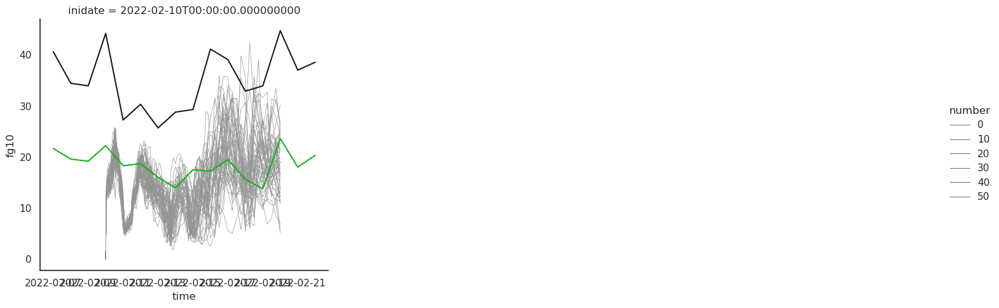

In [109]:
MIDAS_ABERDEEN= MIDAS_2022_GUST.loc[[145],slice('2022-02-07','2022-02-22'),:].MAX_GUST_SPEED.reset_index()
EPS_ABERDEEN = eps_GUST['2022-02-10'].sel(latitude=56.8792,longitude=-3.41952,method='nearest').to_dataframe().reset_index()
ERA_ABERDEEN = era5_GUST.sel(latitude=56.8792,longitude=-3.41952,method='nearest').to_dataframe().reset_index()


g = sns.relplot(data=EPS_ABERDEEN,
                x='time',
                y='fg10',
                col='inidate',
                size='number',
                sizes=(0.5,0.5),
                col_wrap=3,
                kind='line',
                color='xkcd:grey')

g.map(lambda x, **kwargs: sns.lineplot(data=MIDAS_ABERDEEN,x='OB_END_TIME',y='MAX_GUST_SPEED',**kwargs),
    'time',
    color='k',
    zorder=5,
    lw=1.5)

g.map(lambda x, **kwargs: sns.lineplot(data=ERA_ABERDEEN,x='time',y='fg10',**kwargs),
    'time',
    color='xkcd:green',
    zorder=5,
    lw=1.5)

In [ ]:
MIDAS_GC= MIDAS_2022_GUST.loc[[56937],slice('2022-02-07','2022-02-22'),:].MAX_GUST_SPEED.reset_index()
EPS_GC = eps_GUST['2022-02-10'].sel(latitude=57.1651,longitude=-3.22869,method='nearest').to_dataframe().reset_index()
ERA_GC = era5_GUST.sel(latitude=57.1651,longitude=-3.22869,method='nearest').to_dataframe().reset_index()


g = sns.relplot(data=EPS_GC,
                x='time',
                y='fg10',
                col='inidate',
                size='number',
                sizes=(0.5,0.5),
                col_wrap=3,
                kind='line',
                color='xkcd:grey')

g.map(lambda x, **kwargs: sns.lineplot(data=MIDAS_GC,x='OB_END_TIME',y='MAX_GUST_SPEED',**kwargs),
    'time',
    color='k',
    zorder=5,
    lw=1.5)

g.map(lambda x, **kwargs: sns.lineplot(data=ERA_GC,x='time',y='fg10',**kwargs),
    'time',
    color='xkcd:green',
    zorder=5,
    lw=1.5)

In [139]:
MIDAS_Heathrow = MIDAS_2022_GUST.loc[(get_MIDAS_stations_near(lat=53.48,lon=-4,n=10),slice('2022-02-07','2022-02-22')),:].MAX_GUST_SPEED.reset_index()
EPS_Heathrow = eps_GUST['2022-02-10'].sel(latitude=51.48,longitude=-0.449,method='nearest').to_dataframe().reset_index()
ERA_Heathrow = era5_GUST.sel(latitude=51.48,longitude=-0.449,method='nearest').to_dataframe().reset_index()

def rmse(obs, forecast): 
    """
    Function to calculate RMSE for 1d arrays
    """
    return np.sqrt(np.sum((obs-forecast)**2)/len(obs))

g = sns.relplot(data=EPS_Heathrow,
                x='time',
                y='fg10',
                col='inidate',
                size='number',
                sizes=(0.5,0.5),
                col_wrap=3,
                kind='line',
                color='xkcd:grey')

g.map(lambda x, **kwargs: sns.lineplot(data=MIDAS_Heathrow,x='OB_END_TIME',y='MAX_GUST_SPEED',**kwargs),
    'time',
    color='k',
    zorder=5,
    lw=1.5)

g.map(lambda x, **kwargs: sns.lineplot(data=ERA_Heathrow,x='time',y='fg10',**kwargs),
    'time',
    color='xkcd:green',
    zorder=5,
    lw=1.5)

#RMSE_ERA = rmse(EPS_Heathrow.fg10.values)
#print('RMSE(ERA5) = ', RMSE)
#plt.savefig('../../Output/Figures/inidate-selection/HEATHROW-fg10-plume.png')

era = ERA_Heathrow.fg10.values
obs = MIDAS_Heathrow.MAX_GUST_SPEED.values
rmse_eps = []
for i, inidate in enumerate(pd.unique(EPS_Heathrow.inidate)):
    rmse_eps.append([])
    for number in range(50):
        forecast = EPS_Heathrow[(EPS_Heathrow.number == number) & (EPS_Heathrow.inidate == inidate)]
        #rmse_eps[i].append(rmse(obs, forecast))
#rmse_eps = np.mean(rmse_eps, axis = 1)

rmse_era = rmse(era, obs)

test = pd.unique(EPS_Heathrow.inidate)[0]
EPS_Heathrow[(EPS_Heathrow.inidate == test) & (EPS_Heathrow.number == 1)]

ERA_Heathrow[ERA_Heathrow.time >= '2022-02-10']



ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().